In [2]:
import librosa
import numpy as np
from scipy.io import wavfile
import IPython

#name = './stedman9.wav'
#cambridge, sr = librosa.load(name)

def second_deriv(sig):
    return sig[2:] + sig[:-2] - 2*sig[1:-1]

# This is a touch of Stedman triples on our back 8.
five_name = '/Users/gfr/Google Drive/ny striking/single bells/five.wav'
five_sr, five = wavfile.read(five_name)
print(five.shape, five_sr)
five_left = second_deriv(five[:,0]/(32*1024.0))
five_right = second_deriv(five[:,1]/(32*1024.0))
print np.max(five_left)

#alt, alt_sr = librosa.load(name)
#IPython.display.Audio(data=alt, rate=alt_sr)


((844544, 2), 48000)
0.0282592773438


In [3]:
''' Load audio, compute spectrogram and nmf.'''
import matplotlib.pyplot as plt
from scipy import signal
import numpy as np
import librosa
import IPython
import math
from scipy import stats
from scipy import linalg
from sklearn.decomposition import NMF
from scipy.cluster.vq import whiten

def spec(clip, sr, width):
  print(len(clip), max(clip))
#alt, alt_sr = librosa.load(name)
  IPython.display.Audio(data=clip, rate=sr)

  f, t, Sxx = signal.spectrogram(clip, sr, mode='magnitude',
                                 nperseg=width, nfft=width,
                                 noverlap=width-width//8, scaling='density')
  print('frequency resolution is: ', f[1]-f[0])
  # When scaled by f**3, we get a dramatic percussive signal.  This requires adding another NMF
  # component, that will emphasize the percussive element.  It's inconsistent, though, so probably
  # not worth the trouble.
  # Scaling by f**2, (second derivative) we get very nice definition of the bell spectra.
  Sxx = Sxx[:(3*len(f))//4,]
  f = f[:3*len(f)//4]
  fig = plt.figure(figsize=(50,5), dpi=120)
  
  print np.percentile(Sxx, 99.9), np.max(Sxx)
  plt.imshow(Sxx, origin='lower', aspect='auto', extent=[0,t[-1],0,f[-1]], cmap='plasma', clim=(0,np.percentile(Sxx,99.9)))
  plt.show()

  '''
  plt.figure(figsize=(8,8), dpi=120)
  plt.imshow(np.corrcoef(Sxx), origin='lower', cmap='plasma') 
  plt.colorbar()
  plt.show()
  '''
  return f, t, Sxx



(14400, 0.03466796875)
('frequency resolution is: ', 93.75)
0.000351753351312 0.000661688093367


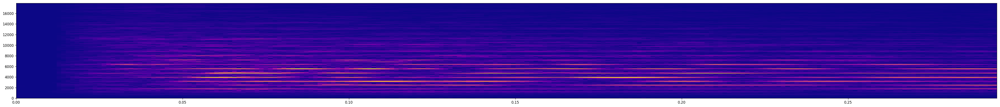

(14400, 0.026824951171875)
('frequency resolution is: ', 93.75)
0.000281106208381 0.000378542721082


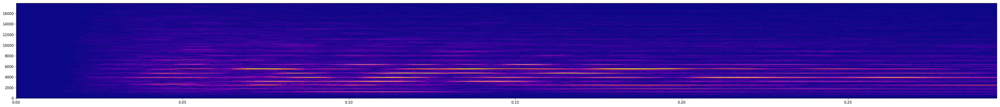

In [4]:
five_f, five_t, five_Sxx_r = spec(five_right[int(11.4*five_sr):int(11.7*five_sr)], five_sr, 512)
five_f, five_t, five_Sxx_l = spec(five_left[int(11.4*five_sr):int(11.7*five_sr)], five_sr, 512)
five_fps = 1/(five_t[1]-five_t[0])


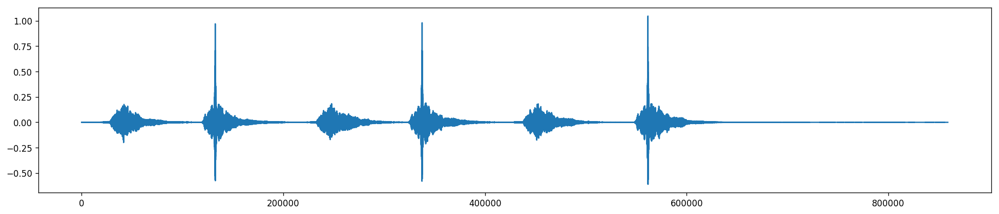

In [5]:
# The autocorrelation is very clean, if taken from the identical microphone placement (and acoustic environment)
from scipy.signal import fftconvolve

c = fftconvolve(five_right, five_right[int(11.4*five_sr):int(11.7*five_sr)][::-1], mode='full')
plt.figure(figsize=(20,4), dpi=120)
plt.plot(c) 
plt.show()


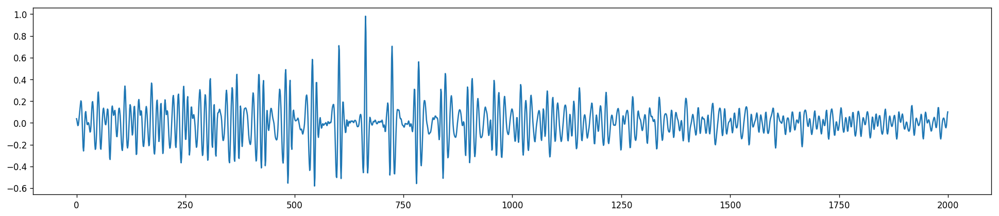

In [6]:
from scipy.signal import fftconvolve

c = fftconvolve(five_right, five_right[int(11.4*five_sr):int(11.7*five_sr)][::-1], mode='full')
plt.figure(figsize=(20,4), dpi=120)
plt.plot(c[337000:339000]) 
plt.show()


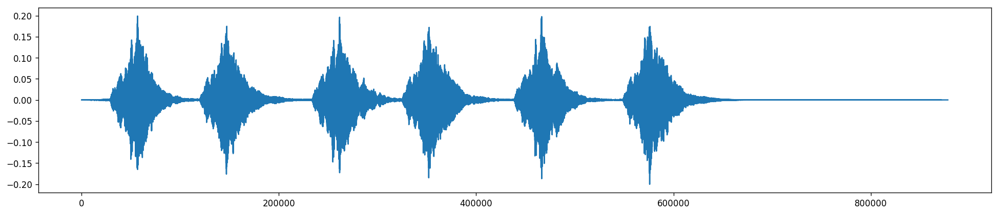

In [7]:
# But correlation with the other microphone if much muddier.  The peaks are only 20% of the amplitude.

from scipy.signal import fftconvolve

c = fftconvolve(five_left, five_right[int(11.3*five_sr):12*five_sr][::-1], mode='full')
plt.figure(figsize=(20,4), dpi=120)
plt.plot(c) 
plt.show()


((27581440, 2), 44100)
(2000000, 0.031646728515625)
('frequency resolution is: ', 10.7666015625)
7.58841028065e-05 0.000218097628866


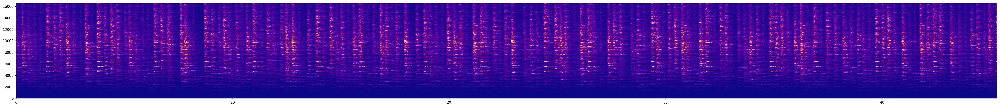

(2000000, 0.031646728515625)
('frequency resolution is: ', 86.1328125)
7.11482508157e-05 0.000249099392294


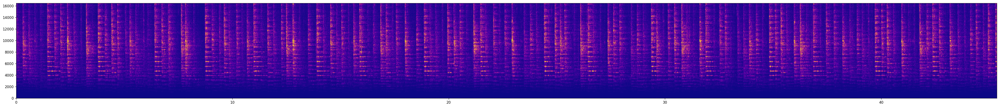

(2000000, 0.031646728515625)
('frequency resolution is: ', 344.53125)
6.50364805725e-05 0.000229165065707


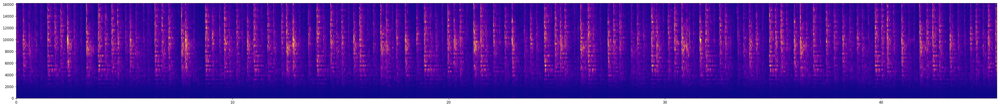

In [87]:
import librosa
from scipy.io import wavfile
import IPython


def ddt(sig):
    return sig[1:] - sig[:-1]

def ddt2(sig):
    return ddt(ddt(sig))

name = '12.51pm-rutland.wav'
rutland_sr, rutland = wavfile.read(name)
print(rutland.shape, rutland_sr)
rutland_left = ddt2(ddt2(rutland[:,0]/(32*1024.0)))
rutland_right = ddt2(ddt2(rutland[:,1]/(32*1024.0)))

rut_fl, rut_tl, rut_Sxxl = spec(rutland_left[5000000:7000000], rutland_sr, 4096)
rut_fr, rut_tr, rut_Sxxr = spec(rutland_right[5000000:7000000], rutland_sr, 512)
rut_fr, rut_tr, rut_Sxxr = spec(rutland_right[5000000:7000000], rutland_sr, 128)
rut_fps = 1/(rut_tl[1]-rut_tl[0])


frame time:  0.0116099773243


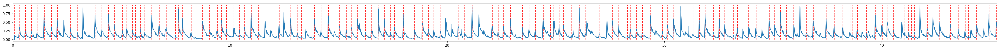

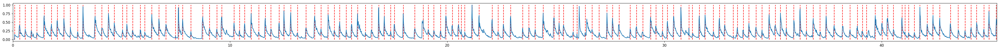

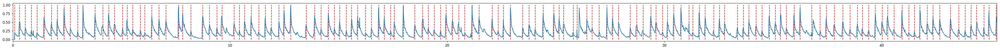

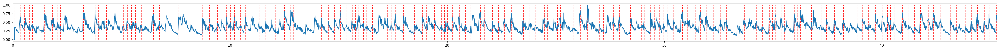

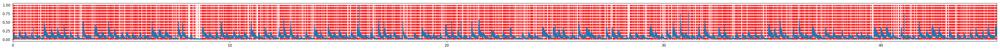

In [83]:
''' Pretty great onset envelope
Detection needs some work
This recording seems to have some noise spikes in it, evidenced by the occasional spikes
in the onset signal.
'''

import librosa

def foo(S, sr, t):
  o_env = librosa.onset.onset_strength(sr=sr, S=S)
  strikes = librosa.onset.onset_detect(onset_envelope=o_env, backtrack=False,
                                      pre_max=5, post_max=5, pre_avg=20, post_avg=5, delta=.01, wait=10)

  plt.figure(figsize=(50,2), dpi=120)
  plt.xlim(0, t[-1])
  plt.plot(t, o_env)
  plt.vlines(t[strikes], 0, o_env.max(), color='r', alpha=0.9, linestyle='--', label='Onsets')
  plt.show()

print "frame time: ", rut_tl[1]-rut_tl[0]
foo(rut_Sxxl[(7*len(rut_fl))//8:,], rutland_sr, rut_tl)
foo(rut_Sxxl[(3*len(rut_fl))//4:,], rutland_sr, rut_tl)
foo(rut_Sxxl[(len(rut_fl))//2:,], rutland_sr, rut_tl)
foo(rut_Sxxl[:(len(rut_fl))//4,], rutland_sr, rut_tl)

foo(rut_Sxxr[(7*len(rut_fr))//8:,], rutland_sr, rut_tr)



((519744, 2), 44100)
4074


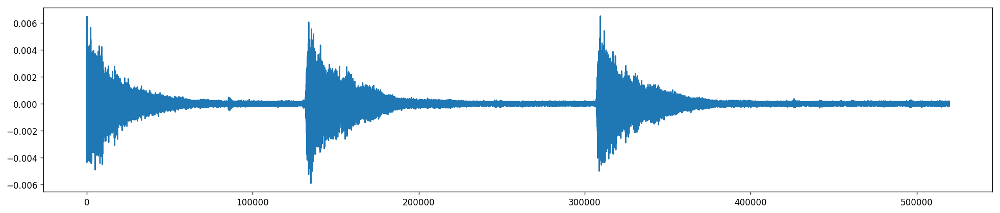

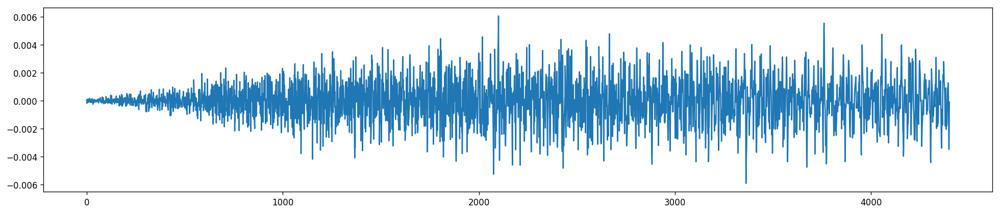

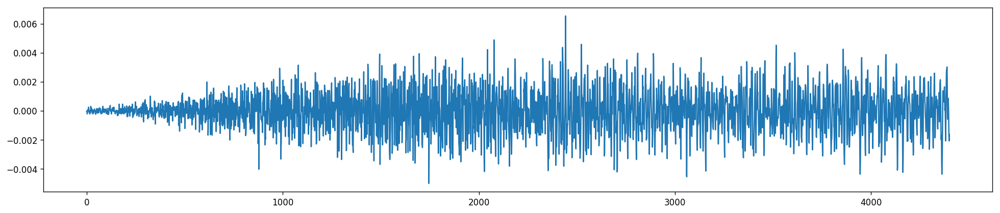

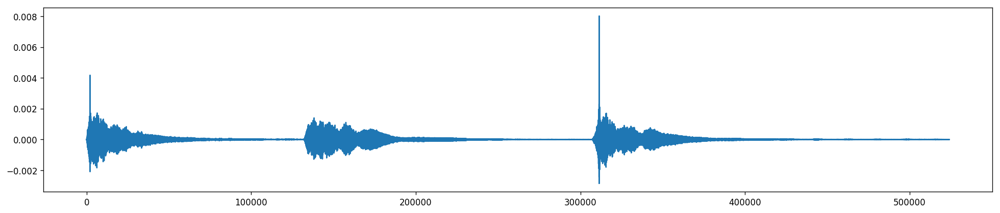

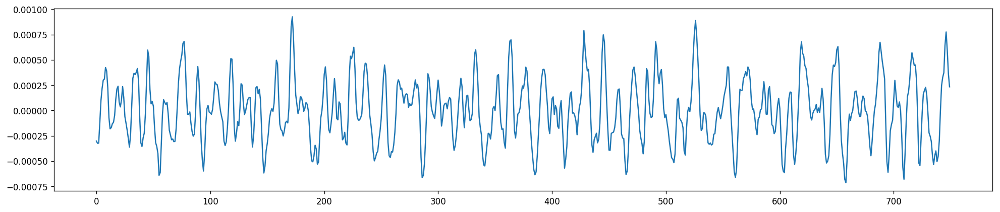

In [62]:
import librosa
import numpy as np
from scipy.io import wavfile
import IPython

name = 'bell strikes 5.wav'
eleven_sr, eleven = wavfile.read(name)
print(eleven.shape, eleven_sr)
eleven_right = ddt2(eleven[:,1]/(32*1024.0))
print np.max(eleven)


plt.figure(figsize=(20,4), dpi=120)
plt.plot(eleven_right) 
plt.show()

hd = 131700
hand = eleven_right[hd:hd+4400][::-1]
plt.figure(figsize=(20,4), dpi=120)
plt.plot(hand[::-1]) 
plt.show()

bk = 307000
back = eleven_right[bk:bk+4400][::-1] 
plt.figure(figsize=(20,4), dpi=120)
plt.plot(back[::-1]) 
plt.show()

c = fftconvolve(eleven_right, back, mode='full')
plt.figure(figsize=(20,4), dpi=120)
plt.plot(c) 
plt.show()

plt.figure(figsize=(20,4), dpi=120)
plt.plot(c[135750:136500]) 
plt.show()

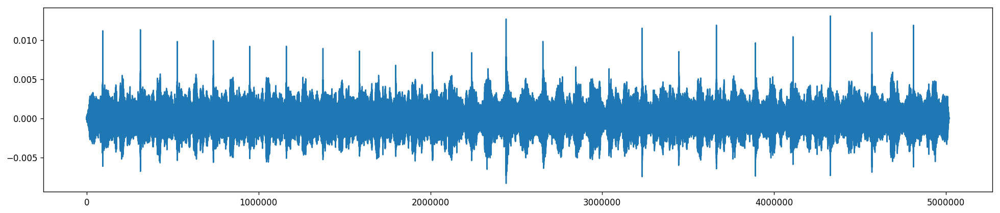

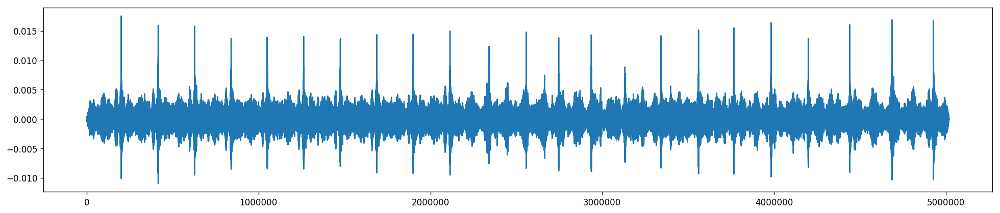

In [19]:
from scipy.signal import fftconvolve

hand = eleven_right[130000:150000][::-1]
back = eleven_right[305000:325000][::-1]
c = fftconvolve(rutland_right, hand, mode='full')
plt.figure(figsize=(20,4), dpi=120)
plt.plot(c) 
plt.show()
c = fftconvolve(rutland_right, back, mode='full')
plt.figure(figsize=(20,4), dpi=120)
plt.plot(c) 
plt.show()

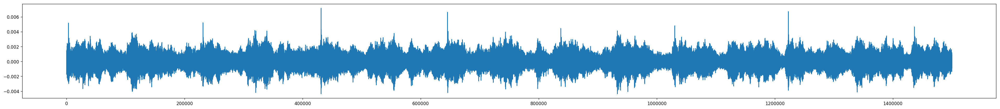

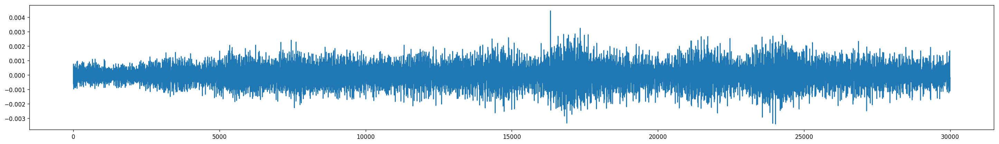

In [20]:
from scipy.signal import fftconvolve

hd = 131700
hand = eleven_right[hd:hd+2*4400][::-1]
bk = 307000
back = eleven_right[bk:bk+2*4400][::-1] 

c = fftconvolve(rutland_right, hand, mode='full')

plt.figure(figsize=(40,4), dpi=120)
plt.plot(c[2000000:3500000])
plt.show()

bad = 2836000
plt.figure(figsize=(30,4), dpi=120)
plt.plot(c[bad-15000:bad+15000]) 
plt.show()

# Hmm - is there a problem because of dopler shift?
# At the strike time, the bell is typically moving about 2-3 radians per second.  What if it differs
# by 1 rad/sec?  This would be about 3ft/sec, which is about .3%, which seems pretty tiny.  Hand and back
# might well be separated by 5 times this much, though, and account for much of the mismatch between hand
# and back patterns.

#c = fftconvolve(rutland_right, back, mode='full')
#plt.figure(figsize=(20,4), dpi=120)
#plt.plot(c) 
#plt.show()

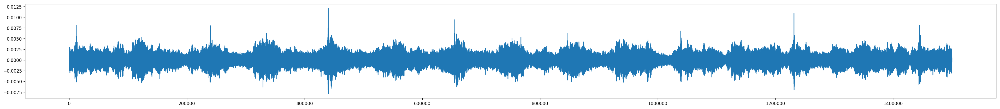

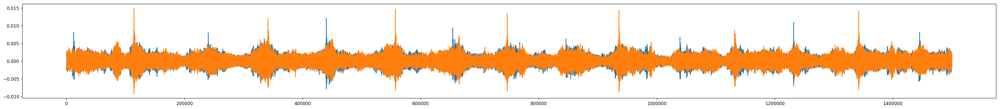

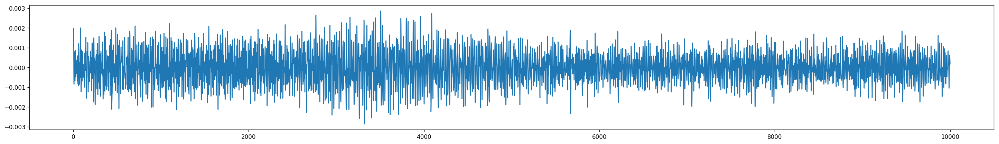

0.00628315936774


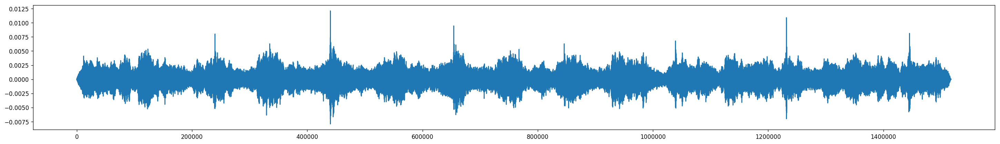

0.00618754185504


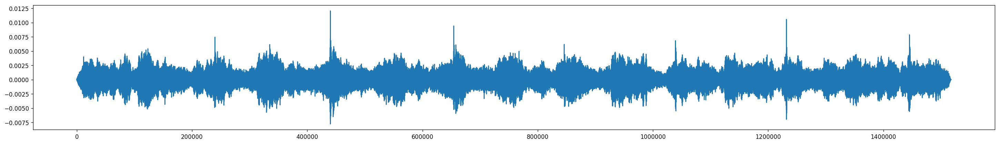

0.00600076444042


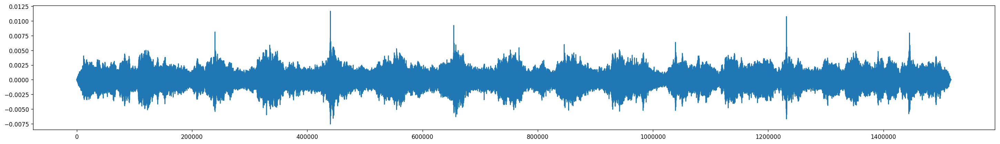

In [21]:
from scipy.signal import fftconvolve
from scipy.signal import resample

hd = 131700
hand = eleven_right[hd:hd+4*4400][::-1]
bk = 307000
back = eleven_right[bk:bk+4*4400][::-1] 

h = fftconvolve(rutland_right, hand, mode='full')

plt.figure(figsize=(40,4), dpi=120)
plt.plot(h[2000000:3500000])
plt.show()
b = fftconvolve(rutland_right, back, mode='full')

plt.figure(figsize=(40,4), dpi=120)
plt.plot(h[2000000:3500000])
plt.plot(b[2000000:3500000])
plt.show()

bad = 3050000
plt.figure(figsize=(30,4), dpi=120)
plt.plot(c[bad-5000:bad+5000]) 
plt.show()

snip = rutland_right[2000000:3500000]

h0c = fftconvolve(snip, hand, mode='full')
print max(h0c[800000:900000])
plt.figure(figsize=(30,4), dpi=120)
plt.plot(h0c) 
plt.show()

h1 = resample(hand, len(hand)-2)
h1c = fftconvolve(snip, h1, mode='full')
print max(h1c[800000:900000])
plt.figure(figsize=(30,4), dpi=120)
plt.plot(h1c) 
plt.show()

h2 = resample(hand, len(hand)+2)
h2c = fftconvolve(snip, h2, mode='full')
print max(h2c[800000:900000])
plt.figure(figsize=(30,4), dpi=120)
plt.plot(h2c) 
plt.show()


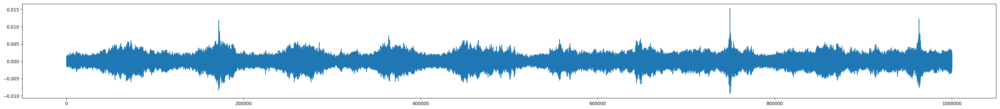

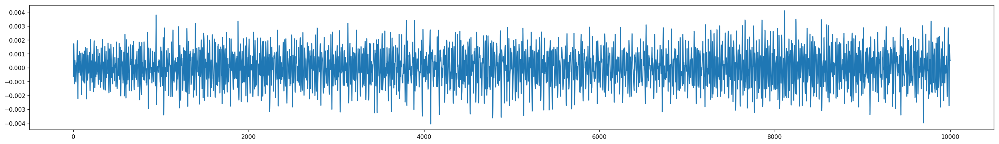

In [129]:
from scipy.signal import fftconvolve

hd = 131700
hand = eleven_right[hd:hd+8*4400][::-1]
bk = 307000
back = eleven_right[bk:bk+8*4400][::-1] 

c = fftconvolve(rutland_right, hand, mode='full')

plt.figure(figsize=(40,4), dpi=120)
plt.plot(c[2500000:3500000])
plt.show()

bad = 3050000
plt.figure(figsize=(30,4), dpi=120)
plt.plot(c[bad-5000:bad+5000]) 
plt.show()

# Hmm - is there a problem because of dopler shift?
# At the strike time, the bell is typically moving about 2-3 radians per second.  What if it differs
# by 1 rad/sec?  This would be about 3ft/sec, which is about .3%, which seems pretty tiny.  Hand and back
# might well be separated by 5 times this much, though, and account for much of the mismatch between hand
# and back patterns.

#c = fftconvolve(rutland_right, back, mode='full')
#plt.figure(figsize=(20,4), dpi=120)
#plt.plot(c) 
#plt.show()

In [ ]:
# Strategy (similar to k-means strategy in early 2017)
# 1. Use some algorithm for onset detection.
# 2. Choose several hundred onsets, ideally about 20 whole pulls.
# 3. Compute the spectrum for about 100 msec following each onset.  Not a spectrogram.
# 4. Find the strikes of a single bell, by searching at appropriate interval through
#    the ringing, looking for matches of a particular onset spectrum.  Repeat until
#    you have all 2N sets of strikes.
# 5a. For a single bell, collect spectra of all patches of ringing that are not within
#    400 msec of strikes of that bell.
#  b. Compute the inverse of the average spectrum for all of the non-strike regions.  Call
#     this the bell's inverse.
#  c. (***) For ALL of the onsets for a single bell, compute the convolution of the 100 msec
#     period, convolved with the bell's inverse, convolved with the 20 whole pulls.


In [ ]:
# Machine Learning?
# 1. Identify, in arbitrary recording, the number of bells.
# 2. Label, in arbitrary recording, rounds, vs changes, vs method ringing?
# 3. Identify onsets for well separated strikes, accurate to +0/-20 msec
# 4.  